In [1]:
import pandas as pd
import numpy as np
import math 

In [2]:
loan_data_backup = pd.read_csv("../Documents/hmeq.csv")

In [3]:
# Para poder tener una copia de la base de datos
loan_data = loan_data_backup.copy()

In [4]:
#Visualizamos la base de datos
loan_data

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0,NaN
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0,NaN
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0,NaN
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5955,0,88900,57264.0,90185.0,DebtCon,Other,16.0,0.0,0.0,221.808718,0.0,16.0,36.112347
5956,0,89000,54576.0,92937.0,DebtCon,Other,16.0,0.0,0.0,208.692070,0.0,15.0,35.859971
5957,0,89200,54045.0,92924.0,DebtCon,Other,15.0,0.0,0.0,212.279697,0.0,15.0,35.556590
5958,0,89800,50370.0,91861.0,DebtCon,Other,14.0,0.0,0.0,213.892709,0.0,16.0,34.340882


In [5]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5960 entries, 0 to 5959
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BAD      5960 non-null   int64  
 1   LOAN     5960 non-null   int64  
 2   MORTDUE  5442 non-null   float64
 3   VALUE    5848 non-null   float64
 4   REASON   5708 non-null   object 
 5   JOB      5681 non-null   object 
 6   YOJ      5445 non-null   float64
 7   DEROG    5252 non-null   float64
 8   DELINQ   5380 non-null   float64
 9   CLAGE    5652 non-null   float64
 10  NINQ     5450 non-null   float64
 11  CLNO     5738 non-null   float64
 12  DEBTINC  4693 non-null   float64
dtypes: float64(9), int64(2), object(2)
memory usage: 605.4+ KB


In [6]:
loan_data['BAD']=np.where((loan_data['BAD']==1),0,1)


In [7]:
#Se trabajan primero con las variables categóricas
loan_data['REASON'].unique()

array(['HomeImp', nan, 'DebtCon'], dtype=object)

In [8]:
#Quitamos lo valores nulos y los cambiamos por un cero. Este valor será "Other"
loan_data['REASON']=loan_data['REASON'].str.replace('HomeImp',str(3))
loan_data['REASON']=loan_data['REASON'].str.replace('DebtCon',str(1))

In [9]:
pd.options.display.max_rows=None
loan_data.isnull().sum()

BAD           0
LOAN          0
MORTDUE     518
VALUE       112
REASON      252
JOB         279
YOJ         515
DEROG       708
DELINQ      580
CLAGE       308
NINQ        510
CLNO        222
DEBTINC    1267
dtype: int64

In [10]:
#Rellenamos valores nulos con un 0 haciendo entender que la razón es otra, 'HomeImp' será el valor 1 y 
#'DebtCon' será el valor 2
loan_data['REASON']=loan_data['REASON'].fillna(2)

In [11]:
pd.options.display.max_rows=None
loan_data.isnull().sum()

BAD           0
LOAN          0
MORTDUE     518
VALUE       112
REASON        0
JOB         279
YOJ         515
DEROG       708
DELINQ      580
CLAGE       308
NINQ        510
CLNO        222
DEBTINC    1267
dtype: int64

In [12]:
#La variable REASON ya está como número
loan_data['REASON']=pd.to_numeric(loan_data['REASON'])
loan_data['REASON'].unique()

array([3, 2, 1], dtype=int64)

In [13]:
loan_data['JOB'].unique()

array(['Other', nan, 'Office', 'Sales', 'Mgr', 'ProfExe', 'Self'],
      dtype=object)

In [14]:
loan_data['JOB']=loan_data['JOB'].fillna('Other')

In [15]:
loan_data['JOB'].unique()

array(['Other', 'Office', 'Sales', 'Mgr', 'ProfExe', 'Self'], dtype=object)

In [16]:
loan_data['JOB']=loan_data['JOB'].str.replace('Other','3')
loan_data['JOB']=loan_data['JOB'].str.replace('Office','1')
loan_data['JOB']=loan_data['JOB'].str.replace('Sales','6')
loan_data['JOB']=loan_data['JOB'].str.replace('Mgr','4')
loan_data['JOB']=loan_data['JOB'].str.replace('ProfExe','2')
loan_data['JOB']=loan_data['JOB'].str.replace('Self','5')

In [17]:
loan_data['JOB'].unique()

array(['3', '1', '6', '4', '2', '5'], dtype=object)

In [18]:
loan_data['JOB']=pd.to_numeric(loan_data['JOB'])
loan_data['JOB'].unique()

array([3, 1, 6, 4, 2, 5], dtype=int64)

In [19]:
loan_data.columns.values

array(['BAD', 'LOAN', 'MORTDUE', 'VALUE', 'REASON', 'JOB', 'YOJ', 'DEROG',
       'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC'], dtype=object)

In [20]:
loan_data['MORTDUE']=loan_data['MORTDUE'].fillna(np.mean(loan_data['MORTDUE']))
loan_data['VALUE']=loan_data['VALUE'].fillna(np.mean(loan_data['VALUE']))
loan_data['YOJ']=loan_data['YOJ'].fillna(np.mean(loan_data['YOJ']))
loan_data['DEROG']=loan_data['DEROG'].fillna(0)
loan_data['DELINQ']=loan_data['DELINQ'].fillna(0)
loan_data['CLAGE']=loan_data['CLAGE'].fillna(np.mean(loan_data['CLAGE']))
loan_data['NINQ']=loan_data['NINQ'].fillna(0)
loan_data['CLNO']=loan_data['CLNO'].fillna(0)
loan_data['DEBTINC']=loan_data['DEBTINC'].fillna(np.mean(loan_data['DEBTINC']))

In [21]:
pd.options.display.max_rows=None
loan_data.isnull().sum()

BAD        0
LOAN       0
MORTDUE    0
VALUE      0
REASON     0
JOB        0
YOJ        0
DEROG      0
DELINQ     0
CLAGE      0
NINQ       0
CLNO       0
DEBTINC    0
dtype: int64

## Tabla de correlaciones

In [22]:
import seaborn as sns 
corr = loan_data.corr() 
corr.style.applymap(lambda x : 'color: red' if abs(x) >= 0.5 else 'color: black')

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
BAD,1.000000,0.075099,0.046034,0.028852,-0.036695,-0.109401,0.058314,-0.269921,-0.346503,0.165113,-0.173449,0.011026,-0.124324
LOAN,0.075099,1.000000,0.216100,0.331862,-0.163132,0.046089,0.100664,0.006996,-0.028869,0.086874,0.055619,0.105156,0.074823
MORTDUE,0.046034,0.216100,1.000000,0.779787,-0.027363,0.014153,-0.082856,-0.046476,0.000542,0.130757,0.032527,0.292237,0.128326
VALUE,0.028852,0.331862,0.779787,1.000000,-0.005553,0.007455,0.007382,-0.040727,-0.003615,0.167938,0.008145,0.261945,0.115796
REASON,-0.036695,-0.163132,-0.027363,-0.005553,1.000000,-0.016684,0.050095,-0.006269,0.006913,0.059785,-0.130317,-0.131633,-0.056507
JOB,-0.109401,0.046089,0.014153,0.007455,-0.016684,1.000000,0.005118,0.066886,0.016722,-0.042072,0.065716,-0.025381,0.053860
YOJ,0.058314,0.100664,-0.082856,0.007382,0.050095,0.005118,1.000000,-0.056245,0.046648,0.190937,-0.056209,0.033304,-0.047642
DEROG,-0.269921,0.006996,-0.046476,-0.040727,-0.006269,0.066886,-0.056245,1.000000,0.171286,-0.080144,0.143596,0.067775,0.010744
DELINQ,-0.346503,-0.028869,0.000542,-0.003615,0.006913,0.016722,0.046648,0.171286,1.000000,0.024874,0.068662,0.175484,0.035353
CLAGE,0.165113,0.086874,0.130757,0.167938,0.059785,-0.042072,0.190937,-0.080144,0.024874,1.000000,-0.106267,0.214628,-0.038052


In [23]:
Bad_Good=loan_data['BAD']

## WoE variables objeto

In [24]:
#Definimos la función de WoE para poder calcularlo de cualquier variable discreta
def woe_discrete(df, discrete_variables_name, good_bad_variables_df):
    df=pd.concat([df[discrete_variables_name], good_bad_variables_df],axis=1)
    df=pd.concat([df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].count(),
                  df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].mean()], axis=1)
    df=df.iloc[:, [0,1,3]]
    df.columns=[df.columns.values[0],'n_obs','prop_good']
    df['prop_n_obs']=df['n_obs']/df['n_obs'].sum()
    df['n_good']=df['prop_good']*df['n_obs']
    df['n_bad']=(1-df['prop_good'])*df['n_obs']
    df['prop_n_good']=df['n_good']/df['n_good'].sum()
    df['prop_n_bad']=df['n_bad']/df['n_bad'].sum()
    df['WoE']=np.log(df['prop_n_bad']/df['prop_n_good'])
    df=df.sort_values(['WoE'])
    df=df.reset_index(drop=True)
    df['diff_prop_good']=df['prop_good'].diff().abs()
    df['diff_WoE']=df['WoE'].diff().abs()
    df['IV']=(df['prop_n_bad']-df['prop_n_good'])*df['WoE']
    df['IV']=df['IV'].sum()
    return df

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
#Definimos una función que nos permita graficar los valores del Information Value
def plot_by_woe(df_WoE,rotation_of_x_axis_labels=0):
    x=np.array(df_WoE.iloc[: , 0].apply(str))
    y=df_WoE['WoE']
    plt.figure(figsize=(18,6))
    plt.plot(x,y, marker='o', linestyle='--', color='k')
    plt.xlabel(df_WoE.columns[0])
    plt.ylabel('Weight of Evidence')
    plt.title(str('Weight of Evidence by '+ df_WoE.columns[0]))
    plt.xticks(rotation=rotation_of_x_axis_labels)

In [26]:
woe_reason=woe_discrete(loan_data,'REASON',Bad_Good)
woe_reason

,REASON,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1,3928,0.810336,0.659060,3183.0,745.0,0.667156,0.626577,-0.062752,NaN,NaN,0.008618
1,2,252,0.809524,0.042282,204.0,48.0,0.042758,0.040370,-0.057476,0.000812,0.005276,0.008618
2,3,1780,0.777528,0.298658,1384.0,396.0,0.290086,0.333053,0.138124,0.031996,0.195600,0.008618


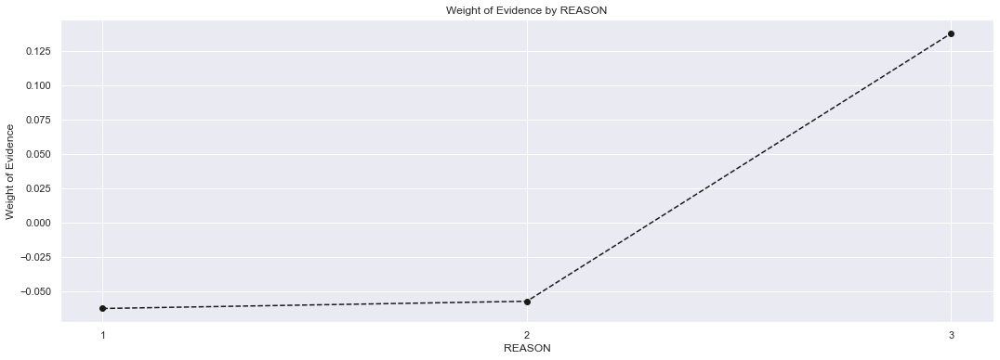

In [27]:
plot_by_woe(woe_reason)

In [28]:
woe_job=woe_discrete(loan_data,'JOB',Bad_Good)
woe_job

,JOB,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1,948,0.868143,0.159060,823.0,125.0,0.172501,0.105130,-0.495199,NaN,NaN,0.077873
1,2,1276,0.833856,0.214094,1064.0,212.0,0.223014,0.178301,-0.223761,0.034288,0.271438,0.077873
2,3,2667,0.783652,0.447483,2090.0,577.0,0.438063,0.485282,0.102366,0.050204,0.326127,0.077873
3,4,767,0.766623,0.128691,588.0,179.0,0.123245,0.150547,0.200102,0.017029,0.097736,0.077873
4,5,193,0.699482,0.032383,135.0,58.0,0.028296,0.048780,0.544612,0.067141,0.344509,0.077873
5,6,109,0.651376,0.018289,71.0,38.0,0.014882,0.031960,0.764350,0.048106,0.219738,0.077873


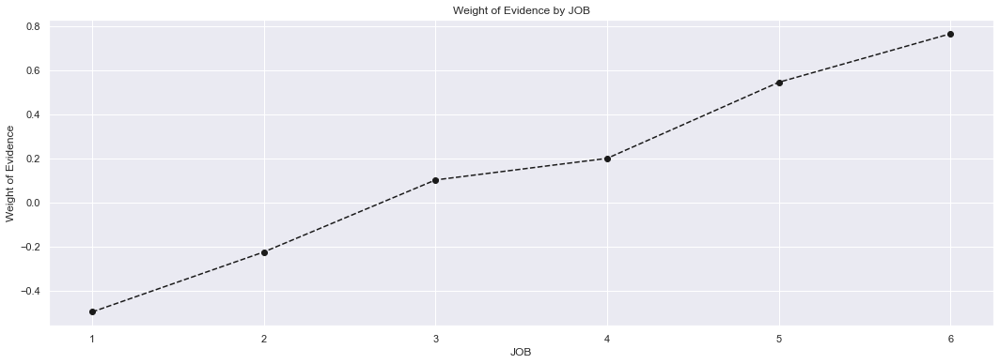

In [29]:
plot_by_woe(woe_job)

## WoE Variables Continuas

In [30]:
# No debemos ordenar por el WoE en las variables continuas
def woe_ordered_continuous(df, continuous_variables_name, good_bad_variables_df):
    df=pd.concat([df[continuous_variables_name], good_bad_variables_df],axis=1)
    df=pd.concat([df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].count(),
                  df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].mean()], axis=1)
    df=df.iloc[:, [0,1,3]]
    df.columns=[df.columns.values[0],'n_obs','prop_good']
    df['prop_n_obs']=df['n_obs']/df['n_obs'].sum()
    df['n_good']=df['prop_good']*df['n_obs']
    df['n_bad']=(1-df['prop_good'])*df['n_obs']
    df['prop_n_good']=df['n_good']/df['n_good'].sum()
    df['prop_n_bad']=df['n_bad']/df['n_bad'].sum()
    df['WoE']=np.log(df['prop_n_bad']/df['prop_n_good'])
    #df=df.sort_values(['WoE'])
    #df=df.reset_index(drop=True)
    df['diff_prop_good']=df['prop_good'].diff().abs()
    df['diff_WoE']=df['WoE'].diff().abs()
    df['IV']=(df['prop_n_bad']-df['prop_n_good'])*df['WoE']
    df['IV']=df['IV'].sum()
    return df

In [31]:
loan_data['LOAN']=np.where((loan_data['LOAN']>=0)&(loan_data['LOAN']<=9980),1,loan_data['LOAN'])
loan_data['LOAN']=np.where((loan_data['LOAN']>9980)&(loan_data['LOAN']<=18860),2,loan_data['LOAN'])
loan_data['LOAN']=np.where((loan_data['LOAN']>18860)&(loan_data['LOAN']<=89900),3,loan_data['LOAN'])

In [32]:
woe_loan=woe_ordered_continuous(loan_data,'LOAN',Bad_Good)
woe_loan

,LOAN,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1,1130,0.715044,0.189597,808.0,322.0,0.169357,0.270816,0.469433,NaN,NaN,0.06691
1,2,2455,0.807739,0.411913,1983.0,472.0,0.415636,0.396972,-0.045944,0.092695,0.515377,0.06691
2,3,2375,0.833684,0.398490,1980.0,395.0,0.415007,0.332212,-0.222523,0.025945,0.176579,0.06691


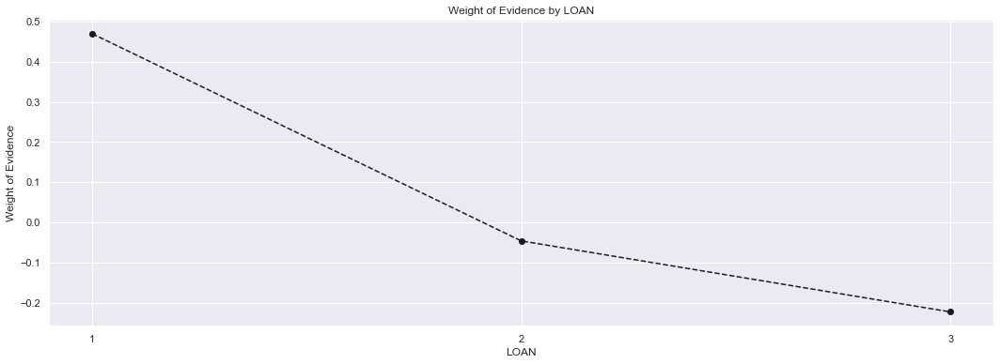

In [33]:
plot_by_woe(woe_loan)

In [34]:
loan_data['MORTDUE']=np.where((loan_data['MORTDUE']>=0)&(loan_data['MORTDUE']<=41811.7),1,loan_data['MORTDUE'])
loan_data['MORTDUE']=np.where((loan_data['MORTDUE']>41811.7)&(loan_data['MORTDUE']<=81560.4),2,loan_data['MORTDUE'])
loan_data['MORTDUE']=np.where((loan_data['MORTDUE']>81560.4)&(loan_data['MORTDUE']<=399550.0),3,loan_data['MORTDUE'])


In [35]:
woe_mortdue=woe_ordered_continuous(loan_data,'MORTDUE',Bad_Good)
woe_mortdue

,MORTDUE,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1.0,1095,0.736986,0.183725,807.0,288.0,0.169147,0.242220,0.359080,NaN,NaN,0.037611
1,2.0,3084,0.806096,0.517450,2486.0,598.0,0.521065,0.502944,-0.035396,0.069110,0.394476,0.037611
2,3.0,1781,0.829871,0.298826,1478.0,303.0,0.309788,0.254836,-0.195269,0.023775,0.159873,0.037611


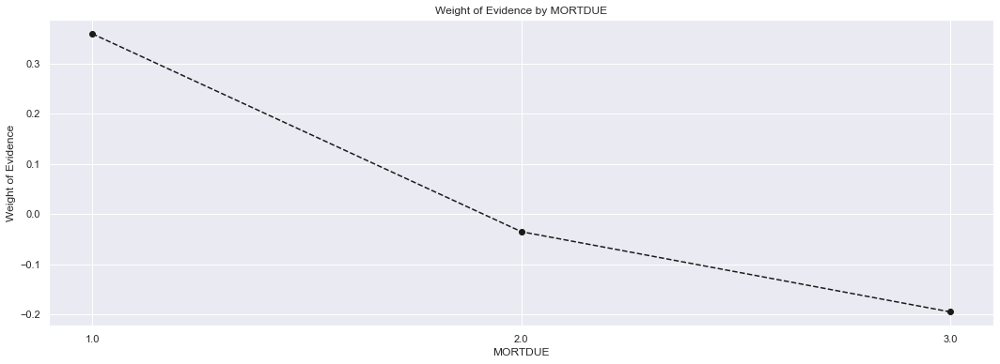

In [36]:
plot_by_woe(woe_mortdue)

In [37]:
loan_data['VALUE']=np.where((loan_data['VALUE']>=0)&(loan_data['VALUE']<=71593.175),1,loan_data['VALUE'])
loan_data['VALUE']=np.where((loan_data['VALUE']>71593.175)&(loan_data['VALUE']<=113988.625),2,loan_data['VALUE'])
loan_data['VALUE']=np.where((loan_data['VALUE']>113988.625)&(loan_data['VALUE']<=855909.0),3,loan_data['VALUE'])


In [38]:
woe_value=woe_ordered_continuous(loan_data,'VALUE',Bad_Good)
woe_value

,VALUE,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1.0,1848,0.780303,0.310067,1442.0,406.0,0.302243,0.341463,0.122010,NaN,NaN,0.018933
1,2.0,2400,0.792500,0.402685,1902.0,498.0,0.398659,0.418839,0.049382,0.012197,0.072628,0.018933
2,3.0,1712,0.833528,0.287248,1427.0,285.0,0.299099,0.239697,-0.221397,0.041028,0.270779,0.018933


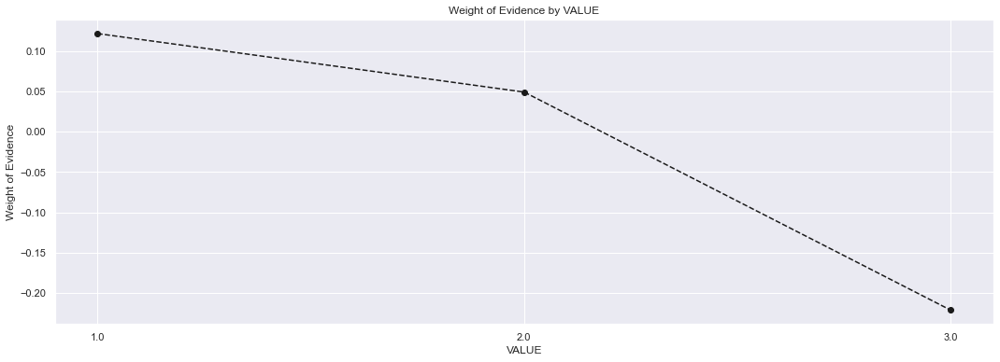

In [39]:
plot_by_woe(woe_value)

In [40]:
loan_data['YOJ']=np.where((loan_data['YOJ']>=0)&(loan_data['YOJ']<=5.467),1,loan_data['YOJ'])
loan_data['YOJ']=np.where((loan_data['YOJ']>5.467)&(loan_data['YOJ']<=10.933),1,loan_data['YOJ'])
loan_data['YOJ']=np.where((loan_data['YOJ']>10.933)&(loan_data['YOJ']<=19.133),2,loan_data['YOJ'])
loan_data['YOJ']=np.where((loan_data['YOJ']>19.133)&(loan_data['YOJ']<=24.6),2,loan_data['YOJ'])
loan_data['YOJ']=np.where((loan_data['YOJ']>24.6)&(loan_data['YOJ']<=41.0),3,loan_data['YOJ'])

In [41]:
woe_YOJ=woe_ordered_continuous(loan_data,'YOJ',Bad_Good)
woe_YOJ

,YOJ,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1.0,4180,0.794258,0.701342,3320.0,860.0,0.695871,0.723297,0.038656,NaN,NaN,0.008101
1,2.0,1513,0.807667,0.253859,1222.0,291.0,0.256131,0.244743,-0.045478,0.013409,0.084133,0.008101
2,3.0,267,0.857678,0.044799,229.0,38.0,0.047998,0.031960,-0.406693,0.050011,0.361215,0.008101


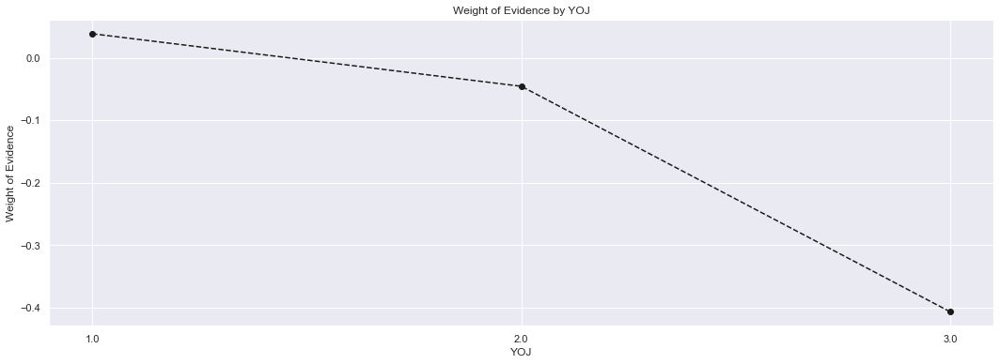

In [42]:
plot_by_woe(woe_YOJ)

In [43]:
loan_data['DEROG']=np.where((loan_data['DEROG']==6),10,loan_data['DEROG'])
loan_data['DEROG']=np.where((loan_data['DEROG']==7),10,loan_data['DEROG'])
loan_data['DEROG']=np.where((loan_data['DEROG']==8),10,loan_data['DEROG'])
loan_data['DEROG']=np.where((loan_data['DEROG']==9),10,loan_data['DEROG'])
loan_data['DEROG']=np.where((loan_data['DEROG']==10),10,loan_data['DEROG'])
loan_data['DEROG']=np.where((loan_data['DEROG']==5),4,loan_data['DEROG'])

In [44]:
woe_DEROG=woe_ordered_continuous(loan_data,'DEROG',Bad_Good)
woe_DEROG

,DEROG,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,5235,0.839351,0.878356,4394.0,841.0,0.920981,0.707317,-0.263960,NaN,NaN,0.404497
1,1.0,435,0.611494,0.072987,266.0,169.0,0.055754,0.142136,0.935846,0.227856,1.199806,0.404497
2,2.0,160,0.487500,0.026846,78.0,82.0,0.016349,0.068966,1.439454,0.123994,0.503608,0.404497
3,3.0,58,0.258621,0.009732,15.0,43.0,0.003144,0.036165,2.442593,0.228879,1.003139,0.404497
4,4.0,38,0.342105,0.006376,13.0,25.0,0.002725,0.021026,2.043370,0.083485,0.399223,0.404497
5,10.0,34,0.147059,0.005705,5.0,29.0,0.001048,0.024390,3.147301,0.195046,1.103931,0.404497


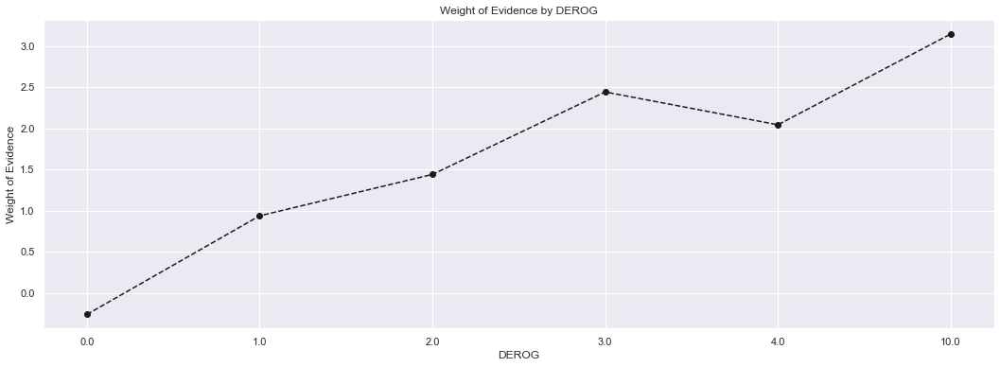

In [45]:
plot_by_woe(woe_DEROG)

In [46]:
loan_data['DELINQ']=np.where((loan_data['DELINQ']==5),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==6),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==7),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==8),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==9),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==10),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==11),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==12),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==13),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==14),10,loan_data['DELINQ'])
loan_data['DELINQ']=np.where((loan_data['DELINQ']==15),10,loan_data['DELINQ'])

In [47]:
woe_DELINQ=woe_ordered_continuous(loan_data,'DELINQ',Bad_Good)
woe_DELINQ

,DELINQ,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,4759,0.862366,0.798490,4104.0,655.0,0.860197,0.550883,-0.445639,NaN,NaN,0.680192
1,1.0,654,0.660550,0.109732,432.0,222.0,0.090547,0.186712,0.723695,0.201816,1.169334,0.680192
2,2.0,250,0.552000,0.041946,138.0,112.0,0.028925,0.094197,1.180688,0.108550,0.456993,0.680192
3,3.0,129,0.449612,0.021644,58.0,71.0,0.012157,0.059714,1.591680,0.102388,0.410992,0.680192
4,4.0,78,0.410256,0.013087,32.0,46.0,0.006707,0.038688,1.752349,0.039356,0.160669,0.680192
5,10.0,90,0.077778,0.015101,7.0,83.0,0.001467,0.069807,3.862374,0.332479,2.110025,0.680192


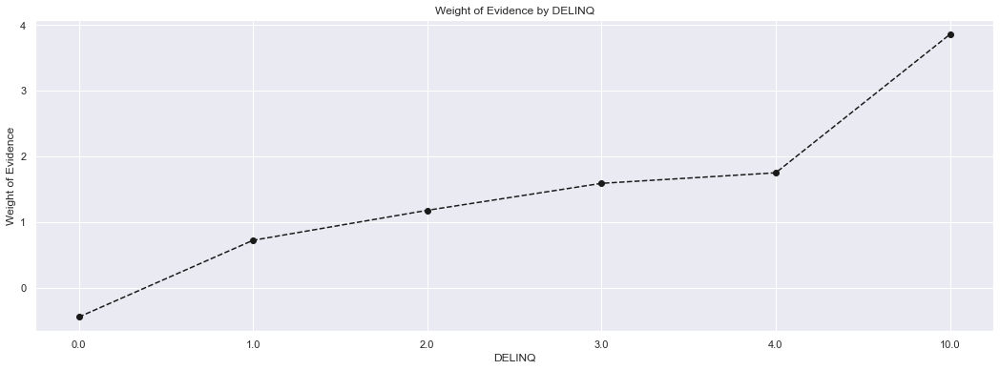

In [48]:
plot_by_woe(woe_DELINQ)

In [49]:
loan_data['CLAGE']=np.where((loan_data['CLAGE']>=0)&(loan_data['CLAGE']<=175.235),1,loan_data['CLAGE'])
loan_data['CLAGE']=np.where((loan_data['CLAGE']>175.235)&(loan_data['CLAGE']<=233.647),2,loan_data['CLAGE'])
loan_data['CLAGE']=np.where((loan_data['CLAGE']>233.647)&(loan_data['CLAGE']<=292.058),3,loan_data['CLAGE'])
loan_data['CLAGE']=np.where((loan_data['CLAGE']>292.058)&(loan_data['CLAGE']<=350.47),4,loan_data['CLAGE'])
loan_data['CLAGE']=np.where((loan_data['CLAGE']>350.47)&(loan_data['CLAGE']<=408.882),5,loan_data['CLAGE'])
loan_data['CLAGE']=np.where((loan_data['CLAGE']>408.882)&(loan_data['CLAGE']<=1168.234),6,loan_data['CLAGE'])

In [50]:
woe_CLAGE=woe_ordered_continuous(loan_data,'CLAGE',Bad_Good)
woe_CLAGE

,CLAGE,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1.0,2889,0.737279,0.484732,2130.0,759.0,0.446447,0.638352,0.357568,NaN,NaN,0.184699
1,2.0,1689,0.831261,0.283389,1404.0,285.0,0.294278,0.239697,-0.205148,0.093982,0.562716,0.184699
2,3.0,781,0.893726,0.131040,698.0,83.0,0.146301,0.069807,-0.739935,0.062465,0.534787,0.184699
3,4.0,455,0.892308,0.076342,406.0,49.0,0.085097,0.041211,-0.725090,0.001418,0.014846,0.184699
4,5.0,102,0.901961,0.017114,92.0,10.0,0.019283,0.008410,-0.829760,0.009653,0.104671,0.184699
5,6.0,44,0.931818,0.007383,41.0,3.0,0.008594,0.002523,-1.225516,0.029857,0.395756,0.184699


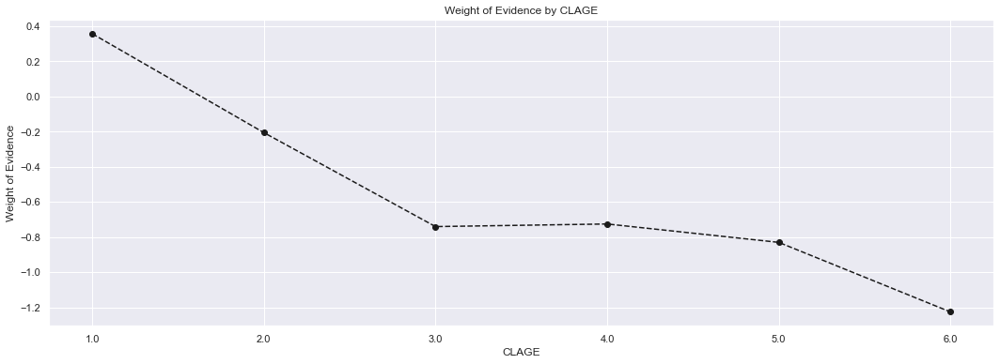

In [51]:
plot_by_woe(woe_CLAGE)

In [52]:

loan_data['NINQ']=np.where((loan_data['NINQ']==9),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==8),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==10),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==11),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==12),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==13),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==14),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==16),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==15),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==17),9,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==5),4,loan_data['NINQ'])
loan_data['NINQ']=np.where((loan_data['NINQ']==7),6,loan_data['NINQ'])

In [53]:
woe_NINQ=woe_ordered_continuous(loan_data,'NINQ',Bad_Good)
woe_NINQ

,NINQ,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,3041,0.845117,0.510235,2570.0,471.0,0.538671,0.396131,-0.307360,NaN,NaN,0.173177
1,1.0,1339,0.810306,0.224664,1085.0,254.0,0.227416,0.213625,-0.062558,0.034811,0.244802,0.173177
2,2.0,780,0.767949,0.130872,599.0,181.0,0.125550,0.152229,0.192679,0.042357,0.255236,0.173177
3,3.0,392,0.727041,0.065772,285.0,107.0,0.059736,0.089992,0.409783,0.040908,0.217104,0.173177
4,4.0,231,0.580087,0.038758,134.0,97.0,0.028086,0.081581,1.066314,0.146954,0.656532,0.173177
5,6.0,100,0.560000,0.016779,56.0,44.0,0.011738,0.037006,1.148281,0.020087,0.081967,0.173177
6,9.0,77,0.545455,0.012919,42.0,35.0,0.008803,0.029437,1.207122,0.014545,0.058841,0.173177


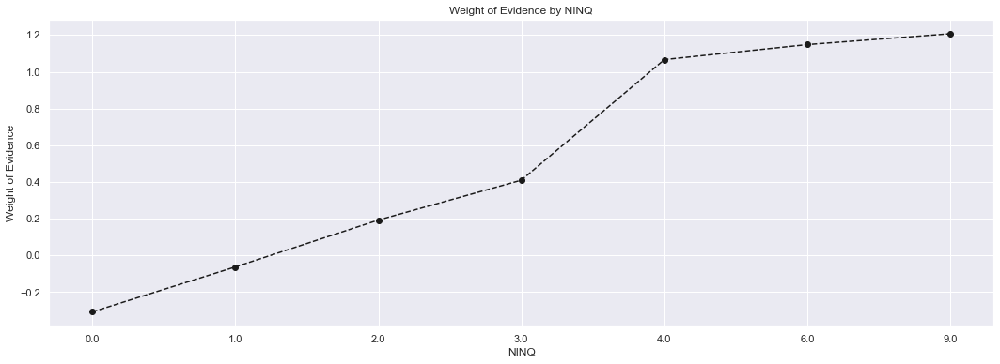

In [54]:
plot_by_woe(woe_NINQ)

In [55]:
loan_data['CLNO']=np.where(loan_data['CLNO'].isin(range(0,11)),1,loan_data['CLNO'])
loan_data['CLNO']=np.where(loan_data['CLNO'].isin(range(11,21)),1,loan_data['CLNO'])
loan_data['CLNO']=np.where(loan_data['CLNO'].isin(range(21,31)),1,loan_data['CLNO'])
loan_data['CLNO']=np.where(loan_data['CLNO'].isin(range(31,41)),4,loan_data['CLNO'])
loan_data['CLNO']=np.where(loan_data['CLNO'].isin(range(41,51)),4,loan_data['CLNO'])
loan_data['CLNO']=np.where(loan_data['CLNO'].isin(range(51,61)),5,loan_data['CLNO'])
loan_data['CLNO']=np.where(loan_data['CLNO'].isin(range(61,72)),5,loan_data['CLNO'])

In [56]:
woe_CLNO=woe_ordered_continuous(loan_data,'CLNO',Bad_Good)
woe_CLNO

,CLNO,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1.0,5031,0.805605,0.844128,4053.0,978.0,0.849507,0.822540,-0.032260,NaN,NaN,0.014515
1,4.0,872,0.784404,0.146309,684.0,188.0,0.143366,0.158116,0.097927,0.021202,0.130187,0.014515
2,5.0,57,0.596491,0.009564,34.0,23.0,0.007126,0.019344,0.998577,0.187912,0.900650,0.014515


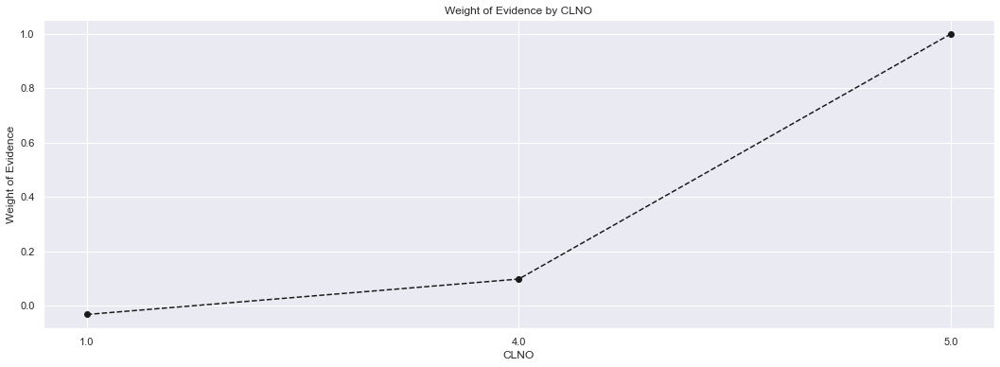

In [57]:
plot_by_woe(woe_CLNO)

In [58]:
loan_data['DEBTINC']=np.where((loan_data['DEBTINC']>=0)&(loan_data['DEBTINC']<=10.664),1,loan_data['DEBTINC'])
loan_data['DEBTINC']=np.where((loan_data['DEBTINC']>10.664)&(loan_data['DEBTINC']<=20.803),1,loan_data['DEBTINC'])
loan_data['DEBTINC']=np.where((loan_data['DEBTINC']>20.803)&(loan_data['DEBTINC']<=30.943),1,loan_data['DEBTINC'])
loan_data['DEBTINC']=np.where((loan_data['DEBTINC']>30.943)&(loan_data['DEBTINC']<=41.082),2,loan_data['DEBTINC'])
loan_data['DEBTINC']=np.where((loan_data['DEBTINC']>41.082)&(loan_data['DEBTINC']<=203.31214869),2,loan_data['DEBTINC'])

In [59]:
woe_DEBTINC=woe_ordered_continuous(loan_data,'DEBTINC',Bad_Good)
woe_DEBTINC

,DEBTINC,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1.0,1520,0.948026,0.255034,1441.0,79.0,0.302033,0.066442,-1.514201,NaN,NaN,0.425249
1,2.0,4440,0.750000,0.744966,3330.0,1110.0,0.697967,0.933558,0.290831,0.198026,1.805032,0.425249


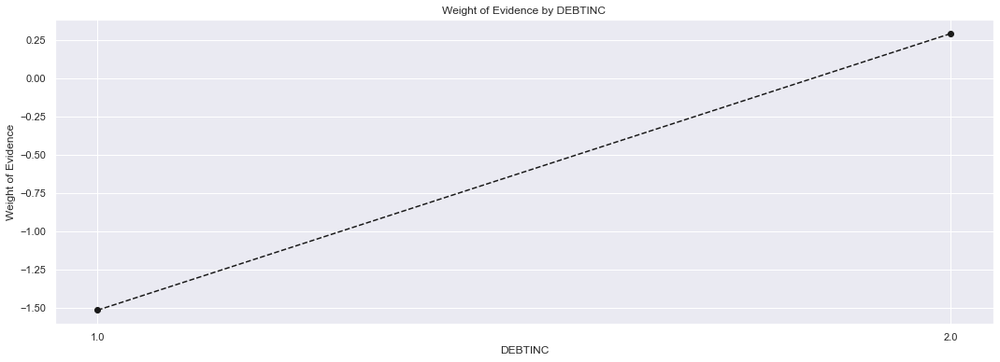

In [60]:
plot_by_woe(woe_DEBTINC)

In [61]:
loan_data=loan_data.drop(["REASON","JOB","LOAN","MORTDUE","VALUE","YOJ"],axis=1)

In [62]:
loan_data.columns.values

array(['BAD', 'DEROG', 'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC'],
      dtype=object)

In [63]:
from sklearn.model_selection import train_test_split
train_test_split(loan_data.drop("BAD",axis=1),loan_data['BAD'])

[      DEROG  DELINQ  CLAGE  NINQ  CLNO  DEBTINC
 953     0.0     1.0    2.0   2.0   1.0      2.0
 448     0.0     1.0    1.0   3.0   1.0      2.0
 2760    0.0     0.0    1.0   1.0   4.0      2.0
 5779    0.0     0.0    4.0   0.0   1.0      2.0
 880     0.0     0.0    5.0   1.0   4.0      2.0
 696     0.0     0.0    1.0   0.0   1.0      2.0
 3774    0.0     1.0    1.0   2.0   1.0      2.0
 427     0.0     0.0    3.0   0.0   1.0      1.0
 3402    2.0     0.0    1.0   3.0   1.0      2.0
 2404    0.0     0.0    1.0   2.0   1.0      2.0
 5152    0.0     1.0    1.0   3.0   1.0      2.0
 3132    1.0     0.0    2.0   6.0   4.0      2.0
 3378    0.0     0.0    2.0   2.0   1.0      2.0
 236     0.0     0.0    1.0   0.0   1.0      2.0
 3848    0.0     0.0    3.0   0.0   4.0      1.0
 2017    0.0     0.0    1.0   0.0   1.0      2.0
 3306    0.0     0.0    1.0   0.0   1.0      1.0
 4629    0.0     1.0    4.0   2.0   4.0      2.0
 2352    0.0     0.0    3.0   3.0   1.0      2.0
 720     0.0     3.0

In [64]:
#Separamos los datos en 80% train y 20% test
loan_data_inputs_train, loan_data_inputs_test, loan_data_targets_train, loan_data_targets_test=train_test_split(loan_data.drop('BAD',axis=1),loan_data['BAD'],test_size=0.2,random_state=0)

In [65]:
loan_data_targets_train.shape

(4768,)

In [66]:
loan_data_inputs_train.shape

(4768, 6)

In [67]:
loan_data_targets_test.shape

(1192,)

In [68]:
loan_data_inputs_test.shape

(1192, 6)

In [69]:
X1=loan_data_inputs_train
X2=loan_data_inputs_test
Y1=loan_data_targets_train
Y2=loan_data_targets_test

In [70]:
X1.isnull().sum()

DEROG      0
DELINQ     0
CLAGE      0
NINQ       0
CLNO       0
DEBTINC    0
dtype: int64

In [71]:
X2.isnull().sum()

DEROG      0
DELINQ     0
CLAGE      0
NINQ       0
CLNO       0
DEBTINC    0
dtype: int64

In [72]:
Y1.isnull().sum()

0

In [73]:
Y2.isnull().sum()

0

## Estimación del Modelo

In [74]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [75]:
LR= LogisticRegression()

In [76]:
pd.options.display.max_rows=None

In [77]:
LR.fit(X1,Y1)

LogisticRegression()

In [78]:
LR.intercept_

array([4.3033791])

In [79]:
LR.coef_

array([[-0.53581971, -0.62206635,  0.48348039, -0.15280417, -0.0377802 ,
        -1.63087221]])

In [80]:
feature_name=X1.columns.values
feature_name

array(['DEROG', 'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC'],
      dtype=object)

In [81]:
summary_table=pd.DataFrame(columns=['Feature name'], data=feature_name)
summary_table['Coefficients']=np.transpose(LR.coef_)
summary_table.index=summary_table.index+1
summary_table.loc[0]=['Intercept', LR.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,4.303379
1,DEROG,-0.535820
2,DELINQ,-0.622066
3,CLAGE,0.483480
4,NINQ,-0.152804
5,CLNO,-0.037780
6,DEBTINC,-1.630872


In [82]:
X1.columns.values

array(['DEROG', 'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC'],
      dtype=object)

## Validación del Modelo 

In [83]:
prediction=LR.predict(X2)
prediction

array([1, 1, 0, ..., 1, 1, 1])

In [84]:
from sklearn import linear_model
probabilidades=LR.predict_proba(X2)
probabilidades

array([[0.20841092, 0.79158908],
       [0.04236245, 0.95763755],
       [0.90378359, 0.09621641],
       ...,
       [0.49048647, 0.50951353],
       [0.01654207, 0.98345793],
       [0.01654207, 0.98345793]])

In [85]:
prob=probabilidades[: ][:,1]
prob

array([0.79158908, 0.95763755, 0.09621641, ..., 0.50951353, 0.98345793,
       0.98345793])

In [86]:
loan_data_targets_test_temp=Y2

In [87]:
loan_data_targets_test_temp.reset_index(drop=True,inplace=True)

In [88]:
df_actual_predicts_probs=pd.concat([loan_data_targets_test_temp, pd.DataFrame(prob)],axis=1)
df_actual_predicts_probs.shape

(1192, 2)

In [89]:
df_actual_predicts_probs.columns=['loan_data_targets_test','prob']

In [90]:
df_actual_predicts_probs.index=X2.index

In [91]:
df_actual_predicts_probs.head()

,loan_data_targets_test,prob
916,0,0.791589
3338,1,0.957638
5754,1,0.096216
4290,1,0.973447
1540,1,0.860327


## Accuracy y Área bajo la curva

In [92]:
threshold=0.5
df_actual_predicts_probs['Y_predicted']=np.where(df_actual_predicts_probs['prob']>threshold,1,0)

In [93]:
pd.crosstab(df_actual_predicts_probs['loan_data_targets_test'],df_actual_predicts_probs['Y_predicted'],
           rownames=['Actual'],colnames=['Predicted'])

Predicted,0,1
Actual,,
0,64,174
1,26,928


In [94]:
pd.crosstab(df_actual_predicts_probs['loan_data_targets_test'],df_actual_predicts_probs['Y_predicted'],
           rownames=['Actual'],colnames=['Predicted']) / df_actual_predicts_probs.shape[0]

Predicted,0,1
Actual,,
0,0.053691,0.145973
1,0.021812,0.778523


In [95]:
(pd.crosstab(df_actual_predicts_probs['loan_data_targets_test'],df_actual_predicts_probs['Y_predicted'],
           rownames=['Actual'],colnames=['Predicted'])/ df_actual_predicts_probs.shape[0]).iloc[0,0]+(pd.crosstab(df_actual_predicts_probs['loan_data_targets_test'],df_actual_predicts_probs['Y_predicted'],
           rownames=['Actual'],colnames=['Predicted']) / df_actual_predicts_probs.shape[0]).iloc[1,1]

0.8322147651006712

In [96]:
LR.score(X1,Y1)

0.8395553691275168

In [97]:
from sklearn import metrics
metrics.accuracy_score(df_actual_predicts_probs['loan_data_targets_test'],df_actual_predicts_probs['Y_predicted'])

0.8322147651006712

### ROC-curve for known the correct threshold to use

In [98]:
from sklearn.metrics import roc_curve, roc_auc_score

In [99]:
#Toma dos valores la función roc(), la primera es the actual observed classes, that is the targets. la segunda son las predicted
#probabilities
roc_curve(df_actual_predicts_probs['loan_data_targets_test'],df_actual_predicts_probs['Y_predicted'])
#Tenemos tres array. El primero son False Positive Rate, el segundo True Positive Rate y el tercero Thresholds

(array([0.        , 0.73109244, 1.        ]),
 array([0.        , 0.97274633, 1.        ]),
 array([2, 1, 0]))

In [100]:
fpr, tpr, thresholds= roc_curve(df_actual_predicts_probs['loan_data_targets_test'],
                                df_actual_predicts_probs['Y_predicted'])
#Además haremos un plot de la curva

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC CURVE')

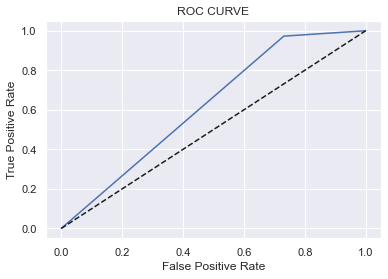

In [102]:
plt.plot(fpr,tpr) #Esta es la Roc Curve
plt.plot(fpr, fpr, linestyle='--', color = 'k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC CURVE')

In [103]:
AUROC=roc_auc_score(df_actual_predicts_probs['loan_data_targets_test'],df_actual_predicts_probs['Y_predicted'])
AUROC

0.6208269471310537

## Evaluación del comportamiento del modelo:
#### Gini & Kolmogorov-Smirnov

In [104]:
#Ordenamos el valor de las prbabilidades de mayor a menor
df_actual_predicts_probs=df_actual_predicts_probs.sort_values('prob')

In [105]:
df_actual_predicts_probs.head()

,loan_data_targets_test,prob,Y_predicted
2955,0,0.000727,0
1192,0,0.000938,0
2178,0,0.001001,0
2753,0,0.001095,0
1196,0,0.001099,0


In [106]:
df_actual_predicts_probs.tail()

,loan_data_targets_test,prob,Y_predicted
828,1,0.992888,1
4523,1,0.993645,1
4238,1,0.995426,1
4264,1,0.996072,1
4390,1,0.996072,1


In [107]:
df_actual_predicts_probs=df_actual_predicts_probs.reset_index()

In [108]:
df_actual_predicts_probs.head()

,index,loan_data_targets_test,prob,Y_predicted
0,2955,0,0.000727,0
1,1192,0,0.000938,0
2,2178,0,0.001001,0
3,2753,0,0.001095,0
4,1196,0,0.001099,0


In [109]:
#Necesitamos para hacer el plot:
# the cumulative % of the total population
df_actual_predicts_probs['Cumulative N Total Population']=df_actual_predicts_probs.index + 1
# the cumulative % of good borrowers
df_actual_predicts_probs['Cumulative N Good Borrowers']=df_actual_predicts_probs['loan_data_targets_test'].cumsum()
# the cumulative % of bad borrowers
df_actual_predicts_probs['Cumulative N Bad Borrowers']=df_actual_predicts_probs['Cumulative N Total Population']-df_actual_predicts_probs['loan_data_targets_test'].cumsum()

In [110]:
df_actual_predicts_probs.head()

,index,loan_data_targets_test,prob,Y_predicted,Cumulative N Total Population,Cumulative N Good Borrowers,Cumulative N Bad Borrowers
0,2955,0,0.000727,0,1,0,1
1,1192,0,0.000938,0,2,0,2
2,2178,0,0.001001,0,3,0,3
3,2753,0,0.001095,0,4,0,4
4,1196,0,0.001099,0,5,0,5


In [111]:
df_actual_predicts_probs['Cumulative % of Total Population']=df_actual_predicts_probs['Cumulative N Total Population']/(df_actual_predicts_probs.shape[0])
df_actual_predicts_probs['Cumulative % of Good Borrowers']=df_actual_predicts_probs['Cumulative N Good Borrowers']/df_actual_predicts_probs['loan_data_targets_test'].sum()
df_actual_predicts_probs['Cumulative % of Bad Borrowers']=df_actual_predicts_probs['Cumulative N Bad Borrowers']/ (df_actual_predicts_probs.shape[0]-df_actual_predicts_probs['loan_data_targets_test'].sum())

In [112]:
df_actual_predicts_probs.head()

,index,loan_data_targets_test,prob,Y_predicted,Cumulative N Total Population,Cumulative N Good Borrowers,Cumulative N Bad Borrowers,Cumulative % of Total Population,Cumulative % of Good Borrowers,Cumulative % of Bad Borrowers
0,2955,0,0.000727,0,1,0,1,0.000839,0.0,0.004202
1,1192,0,0.000938,0,2,0,2,0.001678,0.0,0.008403
2,2178,0,0.001001,0,3,0,3,0.002517,0.0,0.012605
3,2753,0,0.001095,0,4,0,4,0.003356,0.0,0.016807
4,1196,0,0.001099,0,5,0,5,0.004195,0.0,0.021008


In [113]:
df_actual_predicts_probs.tail()

,index,loan_data_targets_test,prob,Y_predicted,Cumulative N Total Population,Cumulative N Good Borrowers,Cumulative N Bad Borrowers,Cumulative % of Total Population,Cumulative % of Good Borrowers,Cumulative % of Bad Borrowers
1187,828,1,0.992888,1,1188,950,238,0.996644,0.995807,1.0
1188,4523,1,0.993645,1,1189,951,238,0.997483,0.996855,1.0
1189,4238,1,0.995426,1,1190,952,238,0.998322,0.997904,1.0
1190,4264,1,0.996072,1,1191,953,238,0.999161,0.998952,1.0
1191,4390,1,0.996072,1,1192,954,238,1.000000,1.000000,1.0


Text(0.5, 1.0, 'Gini')

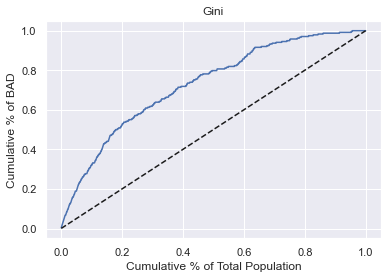

In [114]:
plt.plot(df_actual_predicts_probs['Cumulative % of Total Population'],df_actual_predicts_probs['Cumulative % of Bad Borrowers'])
plt.plot(df_actual_predicts_probs['Cumulative % of Total Population'],df_actual_predicts_probs['Cumulative % of Total Population'],  linestyle = '--',color='k')
plt.xlabel('Cumulative % of Total Population')
plt.ylabel('Cumulative % of BAD')
plt.title('Gini')

In [115]:
Gini=AUROC * 2-1
Gini

0.24165389426210737

Text(0.5, 1.0, 'Kolmogorvo-Smirnov')

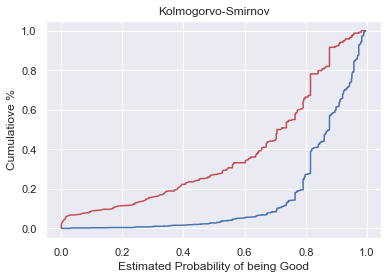

In [116]:
plt.plot(df_actual_predicts_probs['prob'],df_actual_predicts_probs['Cumulative % of Bad Borrowers'], color='r')
plt.plot(df_actual_predicts_probs['prob'],df_actual_predicts_probs['Cumulative % of Good Borrowers'], color='b' )
plt.xlabel('Estimated Probability of being Good')
plt.ylabel('Cumulatiove %')
plt.title('Kolmogorvo-Smirnov')

In [117]:
KS=max(df_actual_predicts_probs['Cumulative % of Bad Borrowers']-df_actual_predicts_probs['Cumulative % of Good Borrowers'])
KS

0.41427514401987203

# Aplicación del modelo
### Cálculo de PD & Score para cuentas individuales

In [118]:
pd.options.display.max_columns =None

In [119]:
loan_data_inputs_test.head()

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
916,0.0,0.0,1.0,1.0,1.0,2.0
3338,0.0,0.0,1.0,0.0,1.0,1.0
5754,10.0,0.0,1.0,0.0,1.0,1.0
4290,0.0,0.0,2.0,0.0,1.0,1.0
1540,0.0,0.0,2.0,1.0,1.0,2.0


In [120]:
Y1.head()

5177    1
4890    1
666     1
1267    1
1461    1
Name: BAD, dtype: int32

In [121]:
summary_table

,Feature name,Coefficients
0,Intercept,4.303379
1,DEROG,-0.535820
2,DELINQ,-0.622066
3,CLAGE,0.483480
4,NINQ,-0.152804
5,CLNO,-0.037780
6,DEBTINC,-1.630872


In [122]:
prob

array([0.79158908, 0.95763755, 0.09621641, ..., 0.50951353, 0.98345793,
       0.98345793])

### Generando un Scorecard

In [123]:
summary_table

,Feature name,Coefficients
0,Intercept,4.303379
1,DEROG,-0.535820
2,DELINQ,-0.622066
3,CLAGE,0.483480
4,NINQ,-0.152804
5,CLNO,-0.037780
6,DEBTINC,-1.630872


In [124]:
def FinalScore(woe,fila,Columna):
    FinalScore=pd.DataFrame(columns=[Columna,'Final Score'])
    FinalScore['Final Score']= woe['WoE']*summary_table['Coefficients'][fila]
    FinalScore[Columna]=woe[Columna]
    return FinalScore

In [125]:
FSDerog= FinalScore(woe_DEROG,1,'DEROG')
FSDerog

,DEROG,Final Score
0,0.0,0.141435
1,1.0,-0.501445
2,2.0,-0.771288
3,3.0,-1.308790
4,4.0,-1.094878
5,10.0,-1.686386


In [126]:
FSDelinq= FinalScore(woe_DELINQ,2,'DELINQ')
FSDelinq.columns.values

array(['DELINQ', 'Final Score'], dtype=object)

In [127]:
FSClage= FinalScore(woe_CLAGE,3,'CLAGE')
FSClage

,CLAGE,Final Score
0,1.0,0.172877
1,2.0,-0.099185
2,3.0,-0.357744
3,4.0,-0.350567
4,5.0,-0.401173
5,6.0,-0.592513


In [128]:
FSNinq= FinalScore(woe_NINQ,4,'NINQ')
FSNinq

,NINQ,Final Score
0,0.0,0.046966
1,1.0,0.009559
2,2.0,-0.029442
3,3.0,-0.062617
4,4.0,-0.162937
5,6.0,-0.175462
6,9.0,-0.184453


In [129]:
FSClno= FinalScore(woe_CLNO,5,'CLNO')
FSClno

,CLNO,Final Score
0,1.0,0.001219
1,4.0,-0.003700
2,5.0,-0.037726


In [130]:
FSDebtInc= FinalScore(woe_DEBTINC,6,'DEBTINC')
FSDebtInc

,DEBTINC,Final Score
0,1.0,2.469469
1,2.0,-0.474308


In [131]:
X1.columns.values

array(['DEROG', 'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC'],
      dtype=object)

In [132]:
FSDebtInc.columns.values

array(['DEBTINC', 'Final Score'], dtype=object)

In [133]:
inputs_train=X1

In [134]:
def FinalScoreNewValues(tabla1,tabla2,key,FinalColumn):
        df1=pd.merge(tabla1,tabla2[[key,FinalColumn]],on=key,how='left')
        df1= df1.drop(['DEROG', 'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC'],axis=1)
        df11=df1.rename(columns={FinalColumn:key},inplace=True)
        return df1

In [135]:
SC1= FinalScoreNewValues(inputs_train,FSDerog,'DEROG','Final Score')
SC2= FinalScoreNewValues(inputs_train,FSDelinq,'DELINQ','Final Score')
SC3= FinalScoreNewValues(inputs_train,FSClage,'CLAGE','Final Score')
SC4= FinalScoreNewValues(inputs_train,FSNinq,'NINQ','Final Score')
SC5= FinalScoreNewValues(inputs_train,FSClno,'CLNO','Final Score')
SC6= FinalScoreNewValues(inputs_train,FSDebtInc,'DEBTINC','Final Score')

In [136]:
type(SC2['DELINQ'][0])

numpy.float64

In [137]:
Pre_SC=pd.concat([SC1,SC2,SC3,SC4,SC5,SC6],axis=1)
Pre_SC

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,0.141435,0.277217,-0.357744,0.009559,-0.003700,-0.474308
1,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308
2,-1.094878,0.277217,-0.099185,0.046966,0.001219,-0.474308
3,0.141435,0.277217,-0.357744,-0.162937,-0.003700,-0.474308
4,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308
5,0.141435,0.277217,-0.099185,0.046966,-0.003700,-0.474308
6,0.141435,0.277217,-0.350567,0.046966,0.001219,-0.474308
7,-0.501445,0.277217,-0.099185,-0.175462,-0.003700,-0.474308
8,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308
9,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308


In [138]:
Pre_SC.shape

(4768, 6)

In [139]:
RawScore=np.sum(Pre_SC,axis=1)
Pre_SC['Raw Score']=RawScore+LR.intercept_
Pre_SC

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Raw Score
0,0.141435,0.277217,-0.357744,0.009559,-0.003700,-0.474308,3.895838
1,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377
2,-1.094878,0.277217,-0.099185,0.046966,0.001219,-0.474308,2.960410
3,0.141435,0.277217,-0.357744,-0.162937,-0.003700,-0.474308,3.723342
4,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377
5,0.141435,0.277217,-0.099185,0.046966,-0.003700,-0.474308,4.191804
6,0.141435,0.277217,-0.350567,0.046966,0.001219,-0.474308,3.945341
7,-0.501445,0.277217,-0.099185,-0.175462,-0.003700,-0.474308,3.326496
8,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757
9,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757


In [140]:
Ratio=abs(min(Pre_SC['Raw Score'])/(max(Pre_SC['Raw Score'])-min(Pre_SC['Raw Score'])))
Ratio

0.018962170008016047

In [141]:
Min=(min(Pre_SC['Raw Score'])/(max(Pre_SC['Raw Score'])-min(Pre_SC['Raw Score'])))+Ratio
Min

0.0

In [142]:
Max=(max(Pre_SC['Raw Score'])/(max(Pre_SC['Raw Score'])-min(Pre_SC['Raw Score'])))+Ratio
Max

1.0

In [143]:
type(Pre_SC)

pandas.core.frame.DataFrame

In [144]:
Pre_SC['Raw Score'][0]

3.89583812686943

In [145]:
Pre_SC['Final Score']=0
Pre_SC

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Raw Score,Final Score
0,0.141435,0.277217,-0.357744,0.009559,-0.003700,-0.474308,3.895838,0
1,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0
2,-1.094878,0.277217,-0.099185,0.046966,0.001219,-0.474308,2.960410,0
3,0.141435,0.277217,-0.357744,-0.162937,-0.003700,-0.474308,3.723342,0
4,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0
5,0.141435,0.277217,-0.099185,0.046966,-0.003700,-0.474308,4.191804,0
6,0.141435,0.277217,-0.350567,0.046966,0.001219,-0.474308,3.945341,0
7,-0.501445,0.277217,-0.099185,-0.175462,-0.003700,-0.474308,3.326496,0
8,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0
9,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0


In [146]:
Pre_SC['Final Score']=Ratio+(Pre_SC['Raw Score']/(max(Pre_SC['Raw Score'])-min(Pre_SC['Raw Score'])))
Pre_SC

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Raw Score,Final Score
0,0.141435,0.277217,-0.357744,0.009559,-0.003700,-0.474308,3.895838,0.534569
1,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284
2,-1.094878,0.277217,-0.099185,0.046966,0.001219,-0.474308,2.960410,0.410766
3,0.141435,0.277217,-0.357744,-0.162937,-0.003700,-0.474308,3.723342,0.511739
4,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284
5,0.141435,0.277217,-0.099185,0.046966,-0.003700,-0.474308,4.191804,0.573739
6,0.141435,0.277217,-0.350567,0.046966,0.001219,-0.474308,3.945341,0.541120
7,-0.501445,0.277217,-0.099185,-0.175462,-0.003700,-0.474308,3.326496,0.459217
8,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220
9,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220


In [147]:
df=pd.to_numeric(Pre_SC['Final Score'])
df=math.e**df
Pre_SC['Exp']=df
Pre_SC['Probabilidad']=df/(1+df)
Pre_SC

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Raw Score,Final Score,Exp,Probabilidad
0,0.141435,0.277217,-0.357744,0.009559,-0.003700,-0.474308,3.895838,0.534569,1.706712,0.630548
1,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284,1.822637,0.645721
2,-1.094878,0.277217,-0.099185,0.046966,0.001219,-0.474308,2.960410,0.410766,1.507973,0.601272
3,0.141435,0.277217,-0.357744,-0.162937,-0.003700,-0.474308,3.723342,0.511739,1.668190,0.625214
4,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284,1.822637,0.645721
5,0.141435,0.277217,-0.099185,0.046966,-0.003700,-0.474308,4.191804,0.573739,1.774891,0.639626
6,0.141435,0.277217,-0.350567,0.046966,0.001219,-0.474308,3.945341,0.541120,1.717930,0.632073
7,-0.501445,0.277217,-0.099185,-0.175462,-0.003700,-0.474308,3.326496,0.459217,1.582835,0.612828
8,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220,1.707823,0.630700
9,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220,1.707823,0.630700


In [148]:
Y1.shape

(4768,)

In [149]:
pd.DataFrame(Y1)
Y1.head()

5177    1
4890    1
666     1
1267    1
1461    1
Name: BAD, dtype: int32

In [150]:
Y1

5177    1
4890    1
666     1
1267    1
1461    1
5558    1
3578    1
3132    0
5285    1
4834    1
295     0
5078    1
4663    1
4871    1
5469    1
1749    0
2587    0
5498    1
3640    1
5043    1
3018    0
5904    0
378     0
1869    1
3060    1
829     1
2247    1
5891    1
453     1
4385    1
2501    1
3286    0
291     1
5242    1
841     1
4697    1
1696    1
5074    1
4767    0
2081    1
3603    1
862     1
2875    1
3431    1
598     1
3512    1
3010    1
4548    1
5029    1
1216    0
2664    0
866     1
5059    1
38      1
158     0
3389    1
4213    1
4241    1
4975    1
5607    1
3117    1
1431    1
4824    1
4873    1
4179    1
3985    1
2240    1
5476    1
1223    1
5147    1
64      0
2033    1
5785    1
2575    1
1544    1
1524    0
1710    1
5864    1
4609    1
2223    0
1386    1
1586    0
635     1
1294    1
3895    1
2190    1
3174    1
5549    1
2212    1
491     1
192     1
2829    1
4802    1
4880    1
1003    1
463     1
541     1
4246    1
4010    1
1755    1


In [151]:
Final_SC=Pre_SC
Final_SC

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Raw Score,Final Score,Exp,Probabilidad
0,0.141435,0.277217,-0.357744,0.009559,-0.003700,-0.474308,3.895838,0.534569,1.706712,0.630548
1,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284,1.822637,0.645721
2,-1.094878,0.277217,-0.099185,0.046966,0.001219,-0.474308,2.960410,0.410766,1.507973,0.601272
3,0.141435,0.277217,-0.357744,-0.162937,-0.003700,-0.474308,3.723342,0.511739,1.668190,0.625214
4,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284,1.822637,0.645721
5,0.141435,0.277217,-0.099185,0.046966,-0.003700,-0.474308,4.191804,0.573739,1.774891,0.639626
6,0.141435,0.277217,-0.350567,0.046966,0.001219,-0.474308,3.945341,0.541120,1.717930,0.632073
7,-0.501445,0.277217,-0.099185,-0.175462,-0.003700,-0.474308,3.326496,0.459217,1.582835,0.612828
8,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220,1.707823,0.630700
9,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220,1.707823,0.630700


In [152]:
Final_SC['Good_Bad']=Y1.values
Final_SC

,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Raw Score,Final Score,Exp,Probabilidad,Good_Bad
0,0.141435,0.277217,-0.357744,0.009559,-0.003700,-0.474308,3.895838,0.534569,1.706712,0.630548,1
1,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284,1.822637,0.645721,1
2,-1.094878,0.277217,-0.099185,0.046966,0.001219,-0.474308,2.960410,0.410766,1.507973,0.601272,1
3,0.141435,0.277217,-0.357744,-0.162937,-0.003700,-0.474308,3.723342,0.511739,1.668190,0.625214,1
4,0.141435,0.277217,0.172877,-0.029442,0.001219,-0.474308,4.392377,0.600284,1.822637,0.645721,1
5,0.141435,0.277217,-0.099185,0.046966,-0.003700,-0.474308,4.191804,0.573739,1.774891,0.639626,1
6,0.141435,0.277217,-0.350567,0.046966,0.001219,-0.474308,3.945341,0.541120,1.717930,0.632073,1
7,-0.501445,0.277217,-0.099185,-0.175462,-0.003700,-0.474308,3.326496,0.459217,1.582835,0.612828,0
8,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220,1.707823,0.630700,1
9,0.141435,0.277217,-0.357744,0.009559,0.001219,-0.474308,3.900757,0.535220,1.707823,0.630700,1
